<a href="https://colab.research.google.com/github/promedius/tutorial/blob/master/KOHI_Hands_On_CycleGAN_tutorial_20200825.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**1. 데이터셋 다운로드** 
###Vangogh(A) <--> Photo(B)
https://github.com/junyanz/CycleGAN


In [ ]:
!wget -N https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/vangogh2photo.zip -O vangogh2photo.zip
!unzip vangogh2photo.zip -d .
!rm vangogh2photo.zip

In [ ]:
src_path = './vangogh2photo' # 데이터 경로

import os

# 데이터 경로에 있는 데이터 수 확인하기
for dirname in os.listdir(src_path):
  print('{} : {}'.format(dirname, len(os.listdir(os.path.join(src_path, dirname)))))

trainA : 400
trainB : 6287
testB : 751
testA : 400


#####**데이터셋 샘플을 눈으로 확인하기**

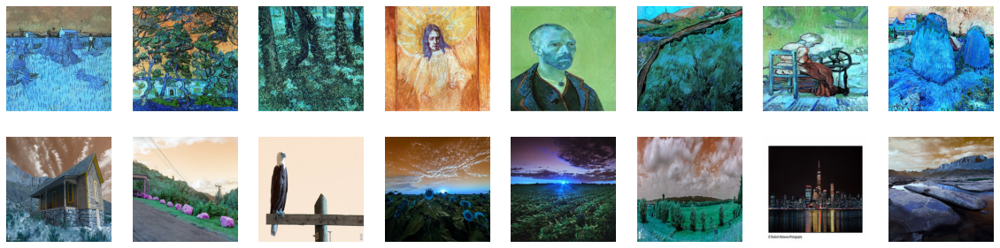

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import os #
import random
import numpy as np

path_A = './vangogh2photo/trainA' # 도메인-A (반고흐) 경로
path_B = './vangogh2photo/trainB' # 도메인-B (사진) 경로

numofimages = 8         # 도메인당 살펴볼 샘플개수
numofdomains = 2        # 도메인 수 (A, B)
_, axarr = plt.subplots(numofdomains, numofimages, figsize = (20,20*(numofdomains/numofimages)))

# 도메인-A
A = random.choices(os.listdir(path_A), k=numofimages)
for i,img_fn in enumerate(A):
    sub_plt = axarr[0, i]
    sub_plt.axis('off')
    sub_plt.imshow(np.array(cv2.imread(os.path.join(path_A,img_fn)), dtype = 'uint8'))

# 도메인-B
B = random.choices(os.listdir(path_B), k=numofimages)
for i,img_fn in enumerate(B):
    sub_plt = axarr[1, i]
    sub_plt.axis('off')
    sub_plt.imshow(np.array(cv2.imread(os.path.join(path_B,img_fn)), dtype = 'uint8'))


#**2. 학습 모델 빌드하기**
tensorflow version : 2.3.0



In [ ]:
import tensorflow as tf
import numpy as np
import os

In [ ]:
# from tensorflow.python.client import device_lib
# device_lib.list_local_devices()

os.environ["CUDA_VISIBLE_DEVICES"] = '0'

In [ ]:
log_path = './logs/task1'           # 기록 파일 및 결과 파일 저장할 경로
lr = 0.0002                         # Learning rate
image_shape = (256, 256, 3)         # h, w, c
batch_size = 1                      # 한 step에서의 이미지 수
epochs = 100                        # 총 학습 epoch수
steps_per_epoch = 100               # 한 epoch당 step수
check_freq = 100                    # 중간중간 결과 정리 빈도. step단위.

###2.1. 데이터셋 빌드



In [ ]:
def read_image(path):
  '''
  path에 있는 jpg영상을 불러온다.
  '''
  f = tf.io.read_file(filename=path)
  f = tf.io.decode_jpeg(contents=f, channels=3)
  return f

def normalize(img, out_min=-1, out_max=1):
  '''
  [0,255]범위의 영상을 [-1,1]로 rescale해준다.
  '''
  img = tf.cast(img, tf.float32)
  img = (img - out_min) / (out_max - out_min)
  return img

def resize(img):
  '''
  영상을 256x256으로 resize해준다.
  '''
  img = tf.image.resize(img, image_shape[:2])
  return img


def load_images(list_path):
  p = list_path.map(read_image)
  p = p.map(normalize)
  p = p.map(resize)
  return tf.constant(list(p.as_numpy_iterator()))

In [ ]:
train_path_A = './vangogh2photo/trainA'
train_path_B = './vangogh2photo/trainB'
test_path_A = './vangogh2photo/testA'
test_path_B = './vangogh2photo/testB'

def get_image_list(path, batch_size=0):
  '''
  path : 영상 상위 디렉토리 경로
  batch_size : 한 step에 입력할 영상 개수
  '''
  list_p = [os.path.join(path,fn) for fn in os.listdir(path)]
  list_p = tf.data.Dataset.from_tensor_slices(list_p)
  list_p = list_p.shuffle(len(list(list_p.as_numpy_iterator())))
  list_p = list_p.repeat()
  if batch_size>0:
    list_p = list_p.batch(batch_size)
  return list_p

# 학습 및 테스트용 데이터셋 준비
train_list_A = get_image_list(train_path_A, batch_size)
train_list_B = get_image_list(train_path_B, batch_size)
test_list_A = get_image_list(test_path_A)
test_list_B = get_image_list(test_path_B)

###2.2. 학습용 네트워크 빌드



In [ ]:
from tensorflow.keras import layers


# 네트워크를 구성하는 모듈들
def relu(x):
    return layers.ReLU()(x)

def lrelu(x, leak=0.2):
    return layers.LeakyReLU(alpha=leak)(x)

def norm(input_, name="instance_norm"):
    depth = input_.shape[3]
    mean, variance = tf.nn.moments(input_, axes=[1,2], keepdims=True)
    epsilon=1e-5
    scale = tf.Variable(tf.random_normal_initializer(1.0, 0.02)(shape=[depth], dtype=tf.float32))
    offset = tf.Variable(tf.constant_initializer(0.0)(shape=[depth]))
    normalized = (input_-mean)*tf.math.rsqrt(variance + epsilon)
    return scale*normalized + offset
    
                                     
def conv2d(batch_input, out_channels, ks=4, s=2, padding='same'):
    return layers.Conv2D(out_channels, kernel_size=ks, strides=s, padding=padding,
                         kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.02))(batch_input)

def deconv2d(batch_input, out_channels, ks=4, s=2):
    return layers.Conv2DTranspose(out_channels, kernel_size=ks, strides=s, padding="same",
                         kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.02))(batch_input)



# Discriminator 네트워크
def discriminator(input_shape, out_channels=3, name='discriminator'):
  
  inputs = tf.keras.Input(shape=input_shape, dtype=tf.float32)
  
  l1 = lrelu(conv2d(inputs, 64))
  l2 = lrelu(norm(conv2d(l1, 64 * 2)))
  l3 = lrelu(norm(conv2d(l2, 64 * 4)))
  l4 = lrelu(norm(conv2d(l3, 64 * 8, s=1)))
  l5 = conv2d(l4, 1, s=1)

  model = tf.keras.Model(inputs=inputs, outputs=l5, name=name)
  return model


# Generator 네트워크
def generator(input_shape, out_channels=3, name='generator'):
  
  def res_block(input_, out_channels, ks=3, s=1):
    p = int((ks - 1) / 2)
    y = tf.pad(input_, [[0, 0], [p, p], [p, p], [0, 0]], mode="REFLECT")
    y = relu(norm(conv2d(y, out_channels, ks=ks, s=s, padding='valid')))
    y = tf.pad(y, [[0, 0], [p, p], [p, p], [0, 0]], mode="REFLECT")
    y = norm(conv2d(y, out_channels, ks=ks, s=s, padding='valid'))
    return y + input_
    
  inputs = tf.keras.Input(shape=input_shape, dtype=tf.float32)

  l0 = tf.pad(inputs, [[0, 0], [3, 3], [3, 3], [0, 0]], mode="REFLECT")
  l1 = relu(norm(conv2d(l0, 64, ks=7, s=1, padding='valid')))
  l2 = relu(norm(conv2d(l1, 128, ks=3, s=2)))
  l3 = relu(norm(conv2d(l2, 256, ks=3, s=2)))

  r1 = res_block(l3, 256)
  r2 = res_block(r1, 256)
  r3 = res_block(r2, 256)
  r4 = res_block(r3, 256)
  r5 = res_block(r4, 256)
  r6 = res_block(r5, 256)
  r7 = res_block(r6, 256)
  r8 = res_block(r7, 256)
  r9 = res_block(r8, 256)

  l4 = relu(norm(deconv2d(r9, 128, ks=3, s=2)))
  l5 = relu(norm(deconv2d(l4, 64, ks=3, s=2)))
  l6 = tf.pad(l5, [[0, 0], [3, 3], [3, 3], [0, 0]], mode="REFLECT")
  l6 = conv2d(l6, out_channels, ks=7, s=1, padding='valid')
  
  outputs = tf.math.tanh(l6)

  model = tf.keras.Model(inputs=inputs, outputs=outputs, name=name)
  return model



# Loss 계산을 위한 모듈
def least_square(A, B):
    return tf.math.reduce_mean((A - B) ** 2)

def abs_criterion(in_, target):
    return tf.math.reduce_mean(tf.math.abs(in_ - target))

def cycle_loss(A, A_rec, B, B_rec, L1_lambda):
    return L1_lambda * (abs_criterion(A, A_rec) + abs_criterion(B, B_rec))

In [ ]:
# A-->B, B-->A 의 Generator, Discriminator 각각 빌드.
G_A2B = generator(image_shape, name='generator_A2B')
G_B2A = generator(image_shape, name='generator_B2A')
D_A = discriminator(image_shape, name='discriminator_A')
D_B = discriminator(image_shape, name='discriminator_B')

# 최적화는 adam을 썼다.
optim_D = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.5)
optim_G = tf.keras.optimizers.Adam(learning_rate=lr, beta_1=0.5)

# step point를 기록하기 위한 check point.
ckpt = tf.train.Checkpoint(step=tf.Variable(0, dtype=tf.int64),
                           p_train=tf.Variable(0, dtype=tf.int64),
                           p_test=tf.Variable(0, dtype=tf.int64))
# log 파일을 기록하기위한 writer.
writer = tf.summary.create_file_writer(log_path)


# 한번의 step에서의 학습.
@tf.function
def train(img_A, img_B, step):
  with tf.GradientTape(persistent=True) as tape:

    # 영상 Generation하기
    fake_B = G_A2B(img_A)     # A-->B
    recon_A = G_B2A(fake_B)   # A-->B-->A'
    fake_A = G_B2A(img_B)     # B-->A
    recon_B = G_A2B(fake_A)   # B-->A-->B'

    # 영상 Discrimination하기
    d_fake_B = D_B(fake_B)
    d_real_B = D_B(img_B)
    d_fake_A = D_A(fake_A)
    d_real_A = D_A(img_A)

    # loss : Generator
    L1_lambda = 10
    loss_cycle = abs_criterion(img_A, recon_A) + abs_criterion(img_B, recon_B)
    loss_G_A2B = least_square(d_fake_B, tf.ones_like(d_fake_B)) + L1_lambda*loss_cycle
    loss_G_B2A = least_square(d_fake_A, tf.ones_like(d_fake_A)) + L1_lambda*loss_cycle
    
    loss_G = least_square(d_fake_B, tf.ones_like(d_fake_B)) + least_square(d_fake_A, tf.ones_like(d_fake_A)) + L1_lambda*loss_cycle

    # loss : Discriminator
    loss_d_real_B = least_square(d_real_B, tf.ones_like(d_real_B))
    loss_d_fake_B = least_square(d_fake_B, tf.zeros_like(d_fake_B))
    loss_d_real_A = least_square(d_real_A, tf.ones_like(d_real_A))
    loss_d_fake_A = least_square(d_fake_A, tf.zeros_like(d_fake_A))

    loss_D_B = (loss_d_real_B + loss_d_fake_B)/2
    loss_D_A = (loss_d_real_A + loss_d_fake_A)/2
    loss_D = loss_D_B + loss_D_A

  # loss를 파일에 기록.  
  with writer.as_default():
    # Generator loss
    with tf.name_scope("Generator_loss"):
        tf.summary.scalar(name="1_G", data=loss_G, step=step)
        tf.summary.scalar(name="2_A2B", data=loss_G_A2B, step=step)
        tf.summary.scalar(name="3_B2A", data=loss_G_B2A, step=step)
        tf.summary.scalar(name="4_cycle", data=loss_cycle, step=step)

    # Discriminator loss
    with tf.name_scope("Discriminator_loss"):
        tf.summary.scalar(name="1_D", data=loss_D, step=step)
        tf.summary.scalar(name="2_real_A", data=loss_d_real_A, step=step)
        tf.summary.scalar(name="3_fake_A", data=loss_d_fake_A, step=step)
        tf.summary.scalar(name="4_real_B", data=loss_d_real_B, step=step)
        tf.summary.scalar(name="5_fake_B", data=loss_d_fake_B, step=step)  

  # Generator 파라미터 업데이트 하기
  G_A2B_gradients = tape.gradient(loss_G, G_A2B.trainable_variables)
  G_B2A_gradients = tape.gradient(loss_G, G_B2A.trainable_variables)
  optim_G.apply_gradients(zip(G_A2B_gradients, G_A2B.trainable_variables))
  optim_G.apply_gradients(zip(G_B2A_gradients, G_B2A.trainable_variables))
  
  # Discriminator 파라미터 업데이트 하기
  D_A_gradients = tape.gradient(loss_D, D_A.trainable_variables)
  D_B_gradients = tape.gradient(loss_D, D_B.trainable_variables)
  optim_D.apply_gradients(zip(D_A_gradients, D_A.trainable_variables))
  optim_D.apply_gradients(zip(D_B_gradients, D_B.trainable_variables))

#**3. 학습 진행**



In [ ]:
def load():
  '''
  log 경로를 기준으로 이미 학습이 진행된것이 있으면 이어서 학습한다.
  진행된 것이 없으면 처음부터 시작.
  '''
  ckpt_state = tf.train.get_checkpoint_state(log_path)
  if ckpt_state and ckpt_state.model_checkpoint_path:
    ckpt.restore(ckpt_state.model_checkpoint_path)
    last_epoch = int(ckpt.step.numpy())//steps_per_epoch
    return last_epoch+1
  else:
    return 0

def save():
  '''
  log 저장.
  '''
  save_fn = 'cyclegan.model.step_{}'.format(ckpt.step)
  if not os.path.exists(log_path):
    os.makedirs(log_path)
  ckpt.save(os.path.join(log_path, save_fn))

def rescale_to_uint8(img):
  '''
  학습결과 영상(dtype=float32)을 8bit의 RGB영상으로 변환한다.
  '''
  i_min = tf.math.reduce_min(img)
  i_max = tf.math.reduce_max(img)
  scale = 255.0 / (i_max - i_min)
  out_data = (img - i_min) * scale
  return tf.dtypes.cast(out_data, np.uint8)

def check_sample(img_A, img_B, phase='train'):
  '''
  학습 중간의 결과들을
  tensorboad로 확인하기 위한 summary들을 기록한다.
  '''
  fake_B = G_A2B(img_A)
  recon_A = G_B2A(fake_B)
  fake_A = G_B2A(img_B)
  recon_B = G_A2B(fake_A)
  
  with writer.as_default():
    with tf.name_scope('check_{}_sample'.format(phase)):
      tf.summary.image(name="1_A", step=ckpt.step, data=rescale_to_uint8(img_A), max_outputs=1)
      tf.summary.image(name="2_B_fake", step=ckpt.step, data=rescale_to_uint8(fake_B), max_outputs=1)
      tf.summary.image(name="3_B", step=ckpt.step, data=rescale_to_uint8(img_B), max_outputs=1)
      tf.summary.image(name="4_A_fake", step=ckpt.step, data=rescale_to_uint8(fake_A), max_outputs=1)



#  학습 진행.
start_epoch = load()
print('Start Epoch {} ... '.format(start_epoch))

# 시작되는 epoch(start_epoch)으로 부터~ 학습이 끝나는 epoch(epochs)까지의 학습
for e in range(start_epoch, epochs):

  # steps_per_epoch만큼의 데이터 경로 꺼내오기.
  dataset_A = train_list_A.skip(ckpt.p_train).take(steps_per_epoch)
  dataset_B = train_list_B.skip(ckpt.p_train).take(steps_per_epoch)
  ckpt.p_train.assign_add(steps_per_epoch)
  
  # steps_per_epoch만큼 GAN학습 진행.
  for i, (a, b) in enumerate(zip(dataset_A, dataset_B)):
    
    # 경로로 부터 영상 데이터 불러오기
    img_a = load_images(tf.data.Dataset.from_tensor_slices(a))
    img_b = load_images(tf.data.Dataset.from_tensor_slices(b))

    # 현재 step에서 학습진행.
    train(img_a, img_b, ckpt.step)
    ckpt.step.assign_add(1)

    # check_freq 에서 정의된 빈도만큼 샘플 확인. --> tensorboard에서 확인할 수 있다.
    if ckpt.step%check_freq == 0:
      # Check trainset
      check_sample(img_a, img_b, phase='train')

      # Check testset
      img_a_test = load_images(test_list_A.skip(ckpt.p_test).take(batch_size))
      img_b_test = load_images(test_list_B.skip(ckpt.p_test).take(batch_size))
      check_sample(img_a_test, img_b_test, phase='test')
      ckpt.p_test.assign_add(batch_size)
      print(("        Checked : {}/{}".format(i+1, steps_per_epoch)))

  # 한번의 epoch이 끝나고, weight를 파일형태로 저장한다.
  print(" *** Epoch : {}/{}".format(e+1, epochs))
  save()

Start Epoch 0 ... 
        Checked : 100/100
 *** Epoch : 1/100
        Checked : 100/100
 *** Epoch : 2/100
        Checked : 100/100
 *** Epoch : 3/100
        Checked : 100/100
 *** Epoch : 4/100
        Checked : 100/100
 *** Epoch : 5/100
        Checked : 100/100
 *** Epoch : 6/100
        Checked : 100/100
 *** Epoch : 7/100
        Checked : 100/100
 *** Epoch : 8/100
        Checked : 100/100
 *** Epoch : 9/100
        Checked : 100/100
 *** Epoch : 10/100
        Checked : 100/100
 *** Epoch : 11/100
        Checked : 100/100
 *** Epoch : 12/100
        Checked : 100/100
 *** Epoch : 13/100
        Checked : 100/100
 *** Epoch : 14/100
        Checked : 100/100
 *** Epoch : 15/100
        Checked : 100/100
 *** Epoch : 16/100
        Checked : 100/100
 *** Epoch : 17/100
        Checked : 100/100
 *** Epoch : 18/100


KeyboardInterrupt: ignored

#**4. Tensorboard로 학습 그래프 및 중간결과 확인하기**
  
GAN은 학습이 오래걸려,  
이번 핸즈온에서는   
공유된 구글드라이브를 Colab에 연결하여   
이미 200epoch만큼 충분히 학습된 결과를 확인해보도록 준비했습니다.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./drive/My\ Drive/DATA/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 117), started 0:01:07 ago. (Use '!kill 117' to kill it.)

<IPython.core.display.Javascript object>